# Concours MTH3302

## Calepin de base (succinct)

In [621]:
# using Pkg
# Pkg.add("Gadfly")
# import Pkg; Pkg.add("StatsBase")
# import Pkg; Pkg.add("MLJLinearModels")

In [622]:
using CSV, DataFrames, MLJLinearModels, MLJ
using Distributions, Gadfly, MLBase, Random, Statistics, StatsBase

In [623]:
train_data = CSV.read("train.csv", DataFrame, decimal=',')
test = CSV.read("test.csv", DataFrame, decimal=',');

# Partager les données en données d'entraînement (80%) et de validation (20%)
train_id = sample(1:nrow(filtered_train), round(Int, .8*nrow(filtered_train)), ordered=true, replace=false)
valid_id = setdiff(1:nrow(filtered_train), train_id)

println("Taille de l'ensemble d'entraînement: ", length(train_id))
println("Taille de l'ensemble de validation: ", length(valid_id))

first(train, 5)

Taille de l'ensemble d'entraînement: 289
Taille de l'ensemble de validation: 72


Row,annee__2014,annee__2015,annee__2016,annee__2017,annee__2018,annee__2019,annee__2020,annee__2021,annee__2022,annee__2023,annee__2024,type__VUS_petit,type__VUS_standard,type__break_moyen,type__break_petit,type__camionnette_petit,type__camionnette_standard,type__monospace,type__voiture_compacte,type__voiture_deux_places,type__voiture_grande,type__voiture_minicompacte,type__voiture_moyenne,type__voiture_sous_compacte,nombre_cylindres__3,nombre_cylindres__4,nombre_cylindres__5,nombre_cylindres__6,nombre_cylindres__8,nombre_cylindres__10,nombre_cylindres__12,cylindree,transmission__4x4,transmission__integrale,transmission__propulsion,transmission__traction,boite__automatique,boite__manuelle,consommation
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.770094,0.0,1.0,0.0,0.0,1.0,0.0,-0.254389
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.373593,0.0,0.0,1.0,0.0,1.0,0.0,0.761546
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.86918,0.0,1.0,0.0,0.0,1.0,0.0,1.43884
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.34133,0.0,1.0,0.0,0.0,1.0,0.0,1.83724
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.20997,0.0,0.0,0.0,1.0,1.0,0.0,-1.52431


Data Exploration

In [624]:
describe(train_data)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,DataType
1,annee,2019.19,2014,2019.0,2024,0,Int64
2,type,,VUS_petit,,voiture_sous_compacte,0,String31
3,nombre_cylindres,5.28535,3,4.0,12,0,Int64
4,cylindree,2.90303,1.2,2.5,6.8,0,Float64
5,transmission,,4x4,,traction,0,String15
6,boite,,automatique,,manuelle,0,String15
7,consommation,10.3568,4.52327,10.2265,16.8007,0,Float64


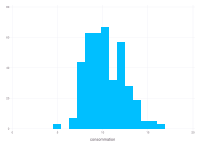

In [625]:
plot(train_data, x=:consommation, Geom.histogram(bincount=15))

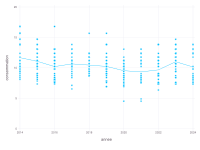

In [626]:
# Calculer la moyenne de la consommation
average_per_year = combine(groupby(train_data, :annee), :consommation => mean)

plot(
    layer(train_data, x=:annee, y=:consommation, Geom.point),
    layer(average_per_year, x=:annee, y=:consommation_mean, Geom.line),
    Guide.xlabel("annee"), Guide.ylabel("consommation")
)


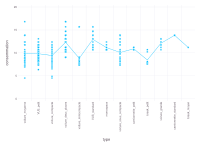

In [627]:
# analyser la consommation par type
average_per_type = combine(groupby(train_data, :type), :consommation => mean)
plot(
    layer(train_data, x=:type, y=:consommation, Geom.point),
    layer(average_per_type, x=:type, y=:consommation_mean, Geom.line),
    Guide.xlabel("type"), Guide.ylabel("consommation")
)

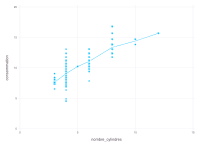

In [628]:
# analyser la consommation par nombre_cylindres
average_per_cylindres = combine(groupby(train_data, :nombre_cylindres), :consommation => mean)
plot(
    layer(train_data, x=:nombre_cylindres, y=:consommation, Geom.point),
    layer(average_per_cylindres, x=:nombre_cylindres, y=:consommation_mean, Geom.line),
    Guide.xlabel("nombre_cylindres"), Guide.ylabel("consommation")
)

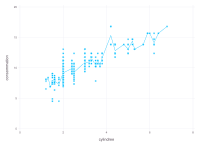

In [629]:
# analyser la consommation par cylindree
average_per_cylindree = combine(groupby(train_data, :cylindree), :consommation => mean)
plot(
    layer(train_data, x=:cylindree, y=:consommation, Geom.point),
    layer(average_per_cylindree, x=:cylindree, y=:consommation_mean, Geom.line),
    Guide.xlabel("cylindree"), Guide.ylabel("consommation")
)

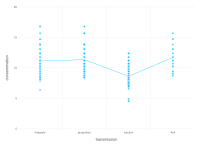

In [630]:
# Analyser la consommation par transmission
average_per_transmission = combine(groupby(train_data, :transmission), :consommation => mean)
plot(
    layer(train_data, x=:transmission, y=:consommation, Geom.point),
    layer(average_per_transmission, x=:transmission, y=:consommation_mean, Geom.line),
    Guide.xlabel("transmission"), Guide.ylabel("consommation")
)

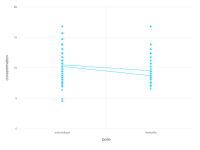

In [631]:
# Analyser la consommation par boite
average_per_boite = combine(groupby(train_data, :boite), :consommation => mean, :consommation => median)
plot(
    layer(train_data, x=:boite, y=:consommation, Geom.point),
    layer(average_per_boite, x=:boite, y=:consommation_median, Geom.line),
    layer(average_per_boite, x=:boite, y=:consommation_mean, Geom.line),
    Guide.xlabel("boite"), Guide.ylabel("consommation")
)

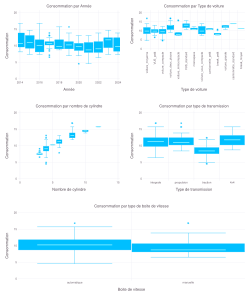

In [632]:
function box_plot_categorical(data)
    Gadfly.set_default_plot_size(25cm, 30cm)
    p1 = plot(data, x=:annee, y=:consommation, Geom.boxplot, Guide.title("Consommation par Année"), Guide.xlabel("Année"), Guide.ylabel("Consommation"))
    p2 = plot(data, x=:type, y=:consommation, Geom.boxplot, Guide.title("Consommation par Type de voiture"), Guide.xlabel("Type de voiture"), Guide.ylabel("Consommation"))
    p3 = plot(data, x=:nombre_cylindres, y=:consommation, Geom.boxplot, Guide.title("Consommation par nombre de cylindre"), Guide.xlabel("Nombre de cylindre"), Guide.ylabel("Consommation"))
    p4 = plot(data, x=:transmission, y=:consommation, Geom.boxplot, Guide.title("Consommation par type de transmission"), Guide.xlabel("Type de transmission"), Guide.ylabel("Consommation"))
    p5 = plot(data, x=:boite, y=:consommation, Geom.boxplot, Guide.title("Consommation par type de boite de vitesse"), Guide.xlabel("Boite de vitesse"), Guide.ylabel("Consommation"))

    grid = vstack(hstack(p1, p2), hstack(p3, p4), p5)
    display(grid)

    # reset default plot size
    Gadfly.set_default_plot_size(20cm, 15cm)
end

box_plot_categorical(train_data)


### Gestion des données aberrantes

In [633]:
# interquartile range IQR
function remove_outliers(data, column)
    unique_values = unique(data[:, column])
    for value in unique_values
        subset = data[data[:, column] .== value, :]
        if size(subset, 1) == 0
            continue
        end
        q1 = quantile(subset[:, :consommation], 0.25)
        q3 = quantile(subset[:, :consommation], 0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        data = data[(data[:, column] .!= value) .| ((data[:, column] .== value) .& (data[:, :consommation] .>= lower_bound) .& (data[:, :consommation] .<= upper_bound)), :]
    end
    return data
end

# copy the
filtered_train = copy(train_data)

filtered_train = remove_outliers(filtered_train, :annee);
filtered_train = remove_outliers(filtered_train, :type);
filtered_train = remove_outliers(filtered_train, :nombre_cylindres);
filtered_train = remove_outliers(filtered_train, :transmission);
filtered_train = remove_outliers(filtered_train, :boite);

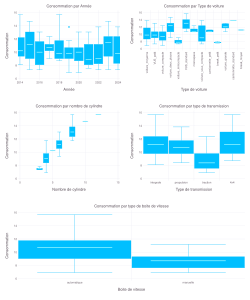

In [634]:
box_plot_categorical(filtered_train)

# Régression linéaire avec une seule variable explicative : nombre de cylindres

In [635]:
# x = train.nombre_cylindres
# y = train.consommation

# n = length(y)

## Ajustement sur l'ensemble d'entraînement

In [636]:
# using Statistics

# ȳ = mean(y)
# X = hcat(ones(n), x)

# β̂ = X\y;

## Prédiction sur l'ensemble de test

In [637]:
# x = test.nombre_cylindres
# n = length(x)

# X = hcat(ones(n), x)
# ŷ = X*β̂;

## Regression Ridge
### ref TD9

In [638]:
# One-hot encoding https://stackoverflow.com/questions/64681247/why-isnt-the-mlj-onehotencoder-transforming-the-data-frame

coerce!(filtered_train, :type => Multiclass, :transmission => Multiclass, :boite => Multiclass, :annee => Multiclass, :nombre_cylindres => Multiclass)
# filtered_train.nombre_cylindres = Float64.(filtered_train.nombre_cylindres)

one_hot = machine(OneHotEncoder(), filtered_train)

fit!(one_hot)

filtered_train = MLJ.transform(one_hot, filtered_train);

first(filtered_train, 5)

[ Info: Training machine(OneHotEncoder(features = Symbol[], …), …).
[ Info: Spawning 11 sub-features to one-hot encode feature :annee.
[ Info: Spawning 13 sub-features to one-hot encode feature :type.
[ Info: Spawning 7 sub-features to one-hot encode feature :nombre_cylindres.
[ Info: Spawning 4 sub-features to one-hot encode feature :transmission.
[ Info: Spawning 2 sub-features to one-hot encode feature :boite.


Row,annee__2014,annee__2015,annee__2016,annee__2017,annee__2018,annee__2019,annee__2020,annee__2021,annee__2022,annee__2023,annee__2024,type__VUS_petit,type__VUS_standard,type__break_moyen,type__break_petit,type__camionnette_petit,type__camionnette_standard,type__monospace,type__voiture_compacte,type__voiture_deux_places,type__voiture_grande,type__voiture_minicompacte,type__voiture_moyenne,type__voiture_sous_compacte,nombre_cylindres__3,nombre_cylindres__4,nombre_cylindres__5,nombre_cylindres__6,nombre_cylindres__8,nombre_cylindres__10,nombre_cylindres__12,cylindree,transmission__4x4,transmission__integrale,transmission__propulsion,transmission__traction,boite__automatique,boite__manuelle,consommation
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4.4,0.0,1.0,0.0,0.0,1.0,0.0,13.8359
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1.0,0.0,0.0,1.0,0.0,9.80042
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,3.3,0.0,0.0,1.0,0.0,1.0,0.0,11.7605
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,5.0,0.0,1.0,0.0,0.0,1.0,0.0,13.0672
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4.4,0.0,1.0,0.0,0.0,1.0,0.0,13.8359


In [639]:
# standardisation de consommation et cylindree
dt_1 = StatsBase.fit(StatsBase.ZScoreTransform, filtered_train.consommation)
filtered_train.consommation = StatsBase.transform(dt_1, filtered_train.consommation)

dt_2 = StatsBase.fit(StatsBase.ZScoreTransform, filtered_train.cylindree)
filtered_train.cylindree = StatsBase.transform(dt_2, filtered_train.cylindree);

### split train test

In [640]:
train = filtered_train[train_id,:]
valid = filtered_train[valid_id,:]

nb_columns_without_last = size(train, 2) - 1
X_train = train[:, 1:nb_columns_without_last]
y_train = train.consommation

X_valid = valid[:, 1:nb_columns_without_last]

# get real L/100km values for RMSE
y_valid = train_data[valid_id, :consommation]

first(X_train, 5)

Row,annee__2014,annee__2015,annee__2016,annee__2017,annee__2018,annee__2019,annee__2020,annee__2021,annee__2022,annee__2023,annee__2024,type__VUS_petit,type__VUS_standard,type__break_moyen,type__break_petit,type__camionnette_petit,type__camionnette_standard,type__monospace,type__voiture_compacte,type__voiture_deux_places,type__voiture_grande,type__voiture_minicompacte,type__voiture_moyenne,type__voiture_sous_compacte,nombre_cylindres__3,nombre_cylindres__4,nombre_cylindres__5,nombre_cylindres__6,nombre_cylindres__8,nombre_cylindres__10,nombre_cylindres__12,cylindree,transmission__4x4,transmission__integrale,transmission__propulsion,transmission__traction,boite__automatique,boite__manuelle
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.34133,0.0,1.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.770094,0.0,1.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.373593,0.0,0.0,1.0,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.86918,0.0,1.0,0.0,0.0,1.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.34133,0.0,1.0,0.0,0.0,1.0,0.0


In [641]:
# https://juliaai.github.io/DataScienceTutorials.jl/getting-started/fit-and-predict/
# https://juliaai.github.io/MLJ.jl/dev/

function ridge_reg(X, y)
    ridge_model = @load RidgeRegressor pkg=MLJLinearModels
    ridge_m = ridge_model(lambda=1.0) 
    ridge_machine = machine(ridge_m, X, y)
    fit!(ridge_machine, verbosity=0)

    return ridge_machine
end

ridge_machine = ridge_reg(X_train, y_train)

import MLJLinearModels ✔


[ Info: For silent loading, specify `verbosity=0`. 


trained Machine; caches model-specific representations of data
  model: RidgeRegressor(lambda = 1.0, …)
  args: 
    1:	Source @444 ⏎ Table{AbstractVector{ScientificTypesBase.Continuous}}
    2:	Source @054 ⏎ AbstractVector{ScientificTypesBase.Continuous}


### Prédictions

In [642]:
ŷ_valid = predict_mode(ridge_machine, X_valid)

ŷ_valid = ŷ_valid .* std(train_data.consommation) .+ mean(train_data.consommation)

first(ŷ_valid, 5)

println("Ridge RMSE: ", rmse(y_valid, ŷ_valid))

Ridge RMSE: 2.2713546703998895


# Création du fichier de prédictions

In [643]:
## transform test data
coerce!(test, :type => Multiclass, :transmission => Multiclass, :boite => Multiclass, :nombre_cylindres => Multiclass, :annee => Multiclass)

one_hot = machine(OneHotEncoder(), test)
fit!(one_hot)

test = MLJ.transform(one_hot, test)

dt = StatsBase.fit(StatsBase.ZScoreTransform, test.cylindree)
test.cylindree = StatsBase.transform(dt, test.cylindree);

[ Info: Training machine(OneHotEncoder(features = Symbol[], …), …).
[ Info: Spawning 11 sub-features to one-hot encode feature :annee.
[ Info: Spawning 13 sub-features to one-hot encode feature :type.
[ Info: Spawning 6 sub-features to one-hot encode feature :nombre_cylindres.
[ Info: Spawning 4 sub-features to one-hot encode feature :transmission.
[ Info: Spawning 2 sub-features to one-hot encode feature :boite.


In [644]:
size_features = size(test, 2) - 1

X_train = filtered_train[:, 1:size_features]
y_train = filtered_train.consommation

X_pred = test[:, 1:size_features]

ridge_machine = ridge_reg(X_train, y_train)

import MLJLinearModels ✔


[ Info: For silent loading, specify `verbosity=0`. 


trained Machine; caches model-specific representations of data
  model: RidgeRegressor(lambda = 1.0, …)
  args: 
    1:	Source @593 ⏎ Table{AbstractVector{ScientificTypesBase.Continuous}}
    2:	Source @923 ⏎ AbstractVector{ScientificTypesBase.Continuous}


In [645]:
ŷ = predict_mode(ridge_machine, test)

150-element Vector{Float64}:
 -0.061865756397250574
 -0.22112659975413892
 -0.204385035704459
  0.1548538195437024
  0.18214856703633367
  0.0202821852948534
  0.17954302865174174
  0.15615658873599833
 -0.08473965694998564
  0.2149243010535037
  0.2149243010535037
 -0.016900314093012625
 -0.20601349719482898
  ⋮
 -0.20923211628570798
 -0.03234747319568227
  0.04352927122328626
 -0.22825643245390687
 -0.2345076109255608
 -0.2295592016462028
 -0.17566650565054676
 -0.24736748794926108
  0.09698853798916099
 -0.06227230536772736
 -0.03703532182498705
 -0.253618666420915

In [646]:
# convert to L/100km (invert standardize)
ŷ = ŷ .* std(train_data.consommation) .+ mean(train_data.consommation)

150-element Vector{Float64}:
 10.224422840917352
  9.883642366808948
  9.919465347611464
 10.68815139013915
 10.746555683342374
 10.400199974372132
 10.740980448480537
 10.69093900757007
 10.175478112817416
 10.816687989201087
 10.816687989201087
 10.32063823463214
  9.915980825822816
  ⋮
  9.909093743495202
 10.287584973757216
 10.449943230764273
  9.868386213968568
  9.855010173013337
  9.86559859653765
  9.98091619818581
  9.82749308283134
 10.564333396544933
 10.22355292243653
 10.277554088294284
  9.81411704187611

In [647]:
id = 1:n

df_pred = DataFrame(id=id, consommation=ŷ)

CSV.write("benchmark.csv", df_pred)

"benchmark.csv"